In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
path = Path('/content/drive/My Drive/')

In [0]:
from fastai.vision import *
from fastai.metrics import error_rate

In [0]:
bs = 64
# bs = 16   # uncomment this line if you run out of memory even after clicking kernel restart

In [0]:
path

PosixPath('/content/drive/My Drive')

In [0]:
path_imgs=path/'single_class_imgs'

In [0]:
path_imgs.mkdir(parents=True, exist_ok=True)
path_imgs

PosixPath('/content/drive/My Drive/single_class_imgs')

In [0]:
src = (ImageList.from_folder(path_imgs,recurse=True)
               .split_by_rand_pct(valid_pct=.20))

In [0]:
src

ItemLists;

Train: ImageList (71 items)
Image (3, 236, 631),Image (3, 519, 1167),Image (3, 204, 461),Image (3, 408, 715),Image (3, 228, 584)
Path: /content/drive/My Drive/single_class_imgs;

Valid: ImageList (17 items)
Image (3, 440, 660),Image (3, 216, 386),Image (3, 190, 265),Image (3, 699, 1044),Image (3, 743, 1565)
Path: /content/drive/My Drive/single_class_imgs;

Test: None

In [0]:
for i in range(100):
    print(src.train.items[i])

/content/drive/My Drive/single_class_imgs/inr/500/10.jpg
/content/drive/My Drive/single_class_imgs/inr/500/12.jpg
/content/drive/My Drive/single_class_imgs/inr/500/3.jpg
/content/drive/My Drive/single_class_imgs/inr/500/27.jpg
/content/drive/My Drive/single_class_imgs/inr/500/25.jpg
/content/drive/My Drive/single_class_imgs/inr/500/57.jpg
/content/drive/My Drive/single_class_imgs/inr/500/6.jpg
/content/drive/My Drive/single_class_imgs/inr/500/44.jpg
/content/drive/My Drive/single_class_imgs/inr/500/54.jpg
/content/drive/My Drive/single_class_imgs/inr/500/53.jpg
/content/drive/My Drive/single_class_imgs/inr/500/62.jpg
/content/drive/My Drive/single_class_imgs/inr/500/63.jpg
/content/drive/My Drive/single_class_imgs/inr/500/85.jpg
/content/drive/My Drive/single_class_imgs/inr/500/69.jpg
/content/drive/My Drive/single_class_imgs/inr/500/91.jpg
/content/drive/My Drive/single_class_imgs/inr/500/82.jpg
/content/drive/My Drive/single_class_imgs/inr/500/72.jpg
/content/drive/My Drive/single_cl

IndexError: ignored

In [0]:
func=lambda i: str(i.parent.relative_to(path_imgs) )

In [0]:
func(src.train.items[0])

'inr/500'

In [0]:
ll = src.label_from_func(func); ll

LabelLists;

Train: LabelList (71 items)
x: ImageList
Image (3, 236, 631),Image (3, 519, 1167),Image (3, 204, 461),Image (3, 408, 715),Image (3, 228, 584)
y: CategoryList
inr/500,inr/500,inr/500,inr/500,inr/500
Path: /content/drive/My Drive/single_class_imgs;

Valid: LabelList (17 items)
x: ImageList
Image (3, 440, 660),Image (3, 216, 386),Image (3, 190, 265),Image (3, 699, 1044),Image (3, 743, 1565)
y: CategoryList
inr/100,inr/50,inr/200,inr/100,inr/200
Path: /content/drive/My Drive/single_class_imgs;

Test: None

In [0]:
tfms = get_transforms(do_flip=False,flip_vert=False, 
                      max_zoom=0.55)

In [0]:
help(get_transforms)

Help on function get_transforms in module fastai.vision.transform:

get_transforms(do_flip:bool=True, flip_vert:bool=False, max_rotate:float=10.0, max_zoom:float=1.1, max_lighting:float=0.2, max_warp:float=0.2, p_affine:float=0.75, p_lighting:float=0.75, xtra_tfms:Union[Collection[fastai.vision.image.Transform], NoneType]=None) -> Collection[fastai.vision.image.Transform]
    Utility func to easily create a list of flip, rotate, `zoom`, warp, lighting transforms.



In [0]:
def get_data(size,bs):
    size=int(size)
    bs=int(bs)
    data = (ll.transform(tfms, size=size)
        .databunch(bs=bs) #for CPU only add ,num_workers=0
        .normalize(imagenet_stats))
    return data
size,bs=256/2,20
data=get_data(size,bs)

In [0]:
data.classes

['inr/100', 'inr/200', 'inr/50', 'inr/500']

In [0]:
data

ImageDataBunch;

Train: LabelList (71 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
inr/500,inr/500,inr/500,inr/500,inr/500
Path: /content/drive/My Drive/single_class_imgs;

Valid: LabelList (17 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
inr/100,inr/50,inr/200,inr/100,inr/200
Path: /content/drive/My Drive/single_class_imgs;

Test: None

In [0]:
data.classes

['inr/100', 'inr/200', 'inr/50', 'inr/500']

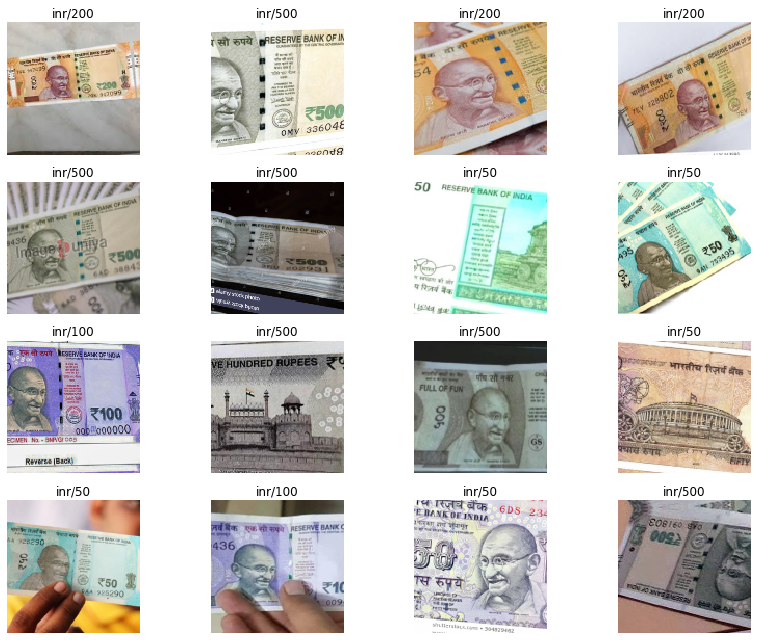

In [0]:
data.show_batch(rows=4, figsize=(12,9))

In [0]:
arch = models.resnet34

In [0]:
acc_02 = partial(accuracy_thresh, thresh=0.2)
f_score = partial(fbeta, thresh=0.2)

In [0]:
#single class
learn = cnn_learner(data, arch, metrics=[accuracy])

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth


In [0]:
learn.unfreeze
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


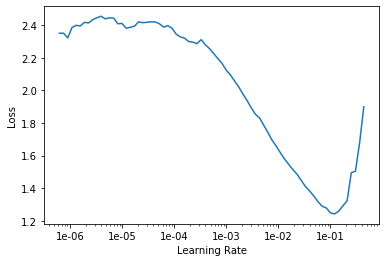

In [0]:
learn.recorder.plot()

In [0]:
lr = 1e-2

epoch,train_loss,valid_loss,accuracy,time
0,2.184612,2.996766,0.235294,00:09
1,1.652949,1.894130,0.588235,00:09
2,1.202714,2.733812,0.588235,00:09
3,1.063919,2.962565,0.588235,00:09
4,0.918530,1.864810,0.705882,00:09
5,0.807149,1.193595,0.823529,00:09
6,0.757983,1.038497,0.823529,00:09
7,0.674864,1.012956,0.823529,00:09
8,0.626697,1.012928,0.764706,00:09
9,0.567202,0.995597,0.823529,00:09


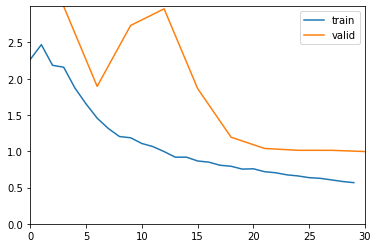

In [0]:
learn.fit_one_cycle(10, slice(lr),callbacks=ShowGraph(learn))

epoch,train_loss,valid_loss,accuracy,time
0,0.176451,0.950538,0.823529,00:09
1,0.129427,0.995029,0.764706,00:09
2,0.180275,1.185487,0.764706,00:09
3,0.177263,1.258699,0.764706,00:09
4,0.191525,1.164691,0.764706,00:09


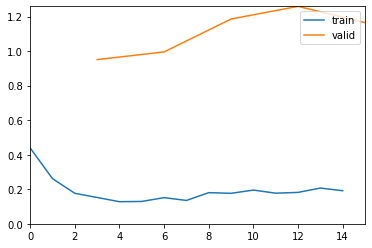

In [0]:
learn.fit_one_cycle(5, slice(lr),callbacks=ShowGraph(learn))

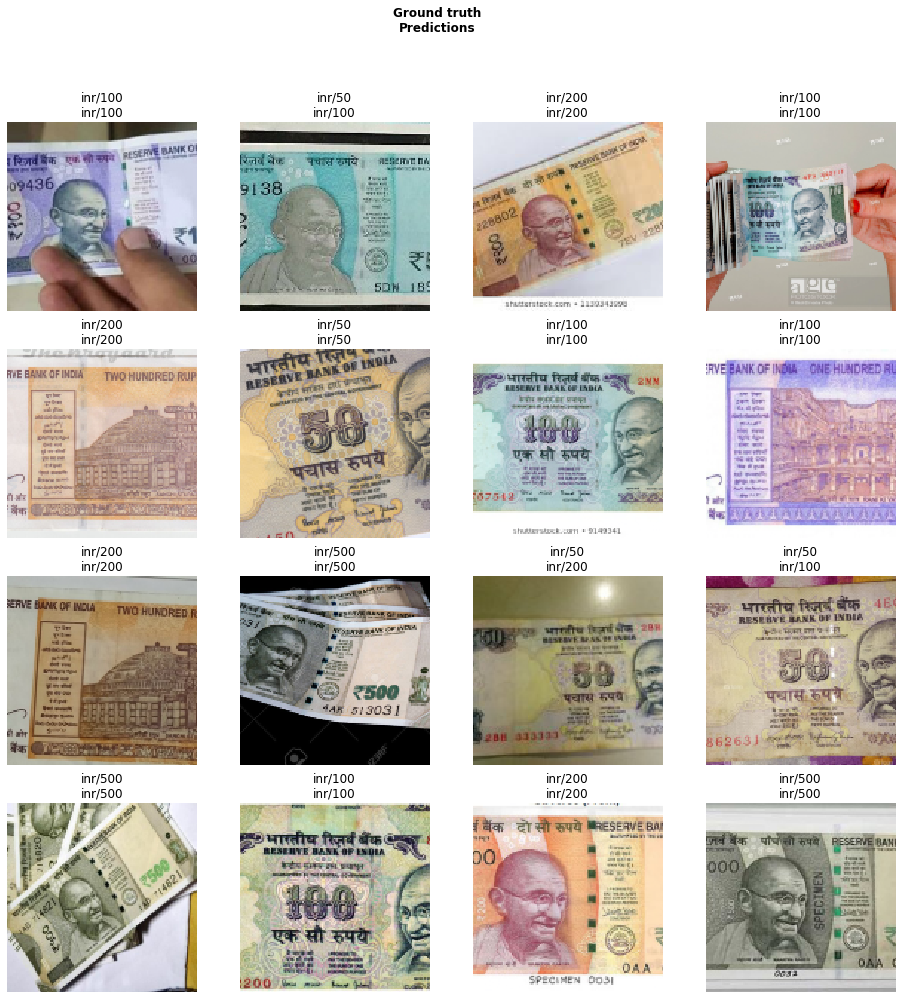

In [0]:
learn.show_results(rows=4)

In [0]:
learn.save('stage-1-rn18')

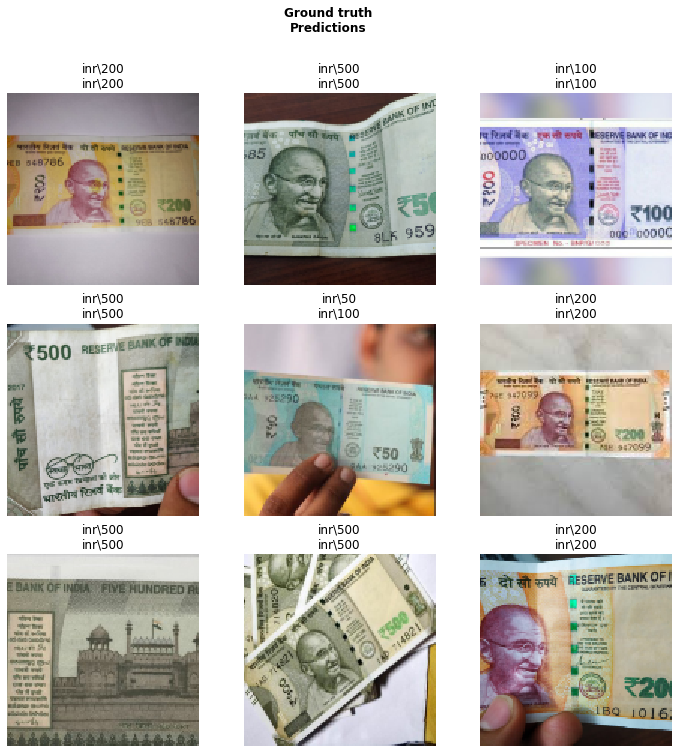

In [0]:
learn.show_results(rows=3)

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

In [0]:

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

True

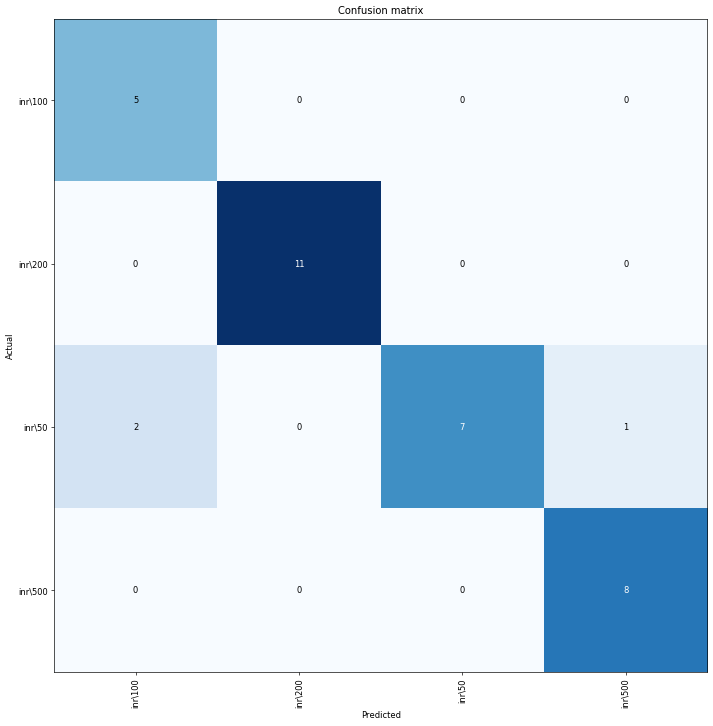

In [0]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [0]:
learn.save('stage1-remove-resnet18')

In [0]:
learn.unfreeze()

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


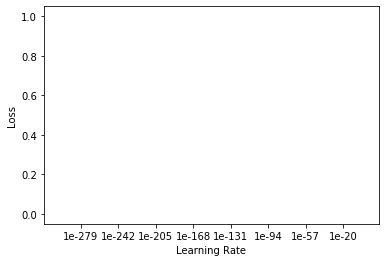

In [0]:
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,accuracy,time
0,0.403363,1.187973,0.818182,00:08
1,0.311669,1.169732,0.818182,00:08
2,0.280718,1.111225,0.818182,00:08
3,0.297194,1.076426,0.818182,00:08
4,0.258119,1.064513,0.772727,00:08


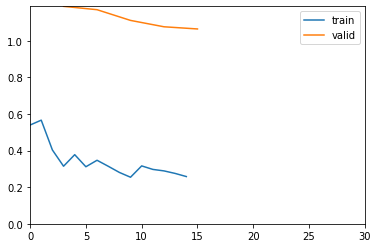

Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, b

KeyboardInterrupt: ignored

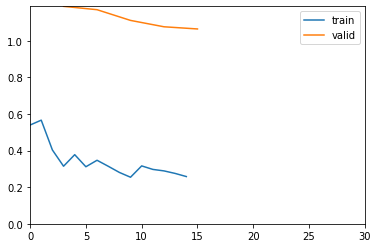

In [0]:
learn.unfreeze()
lr=1e-5
learn.fit_one_cycle(10, max_lr=slice(lr/5, 1e-4),callbacks=ShowGraph(learn))

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

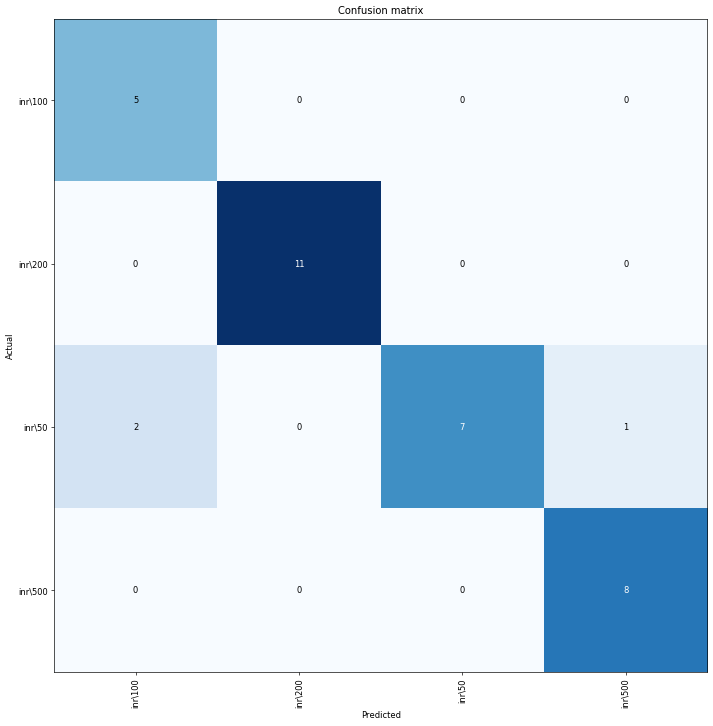

In [0]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [0]:
interp.most_confused(min_val=1)

[('inr\\50', 'inr\\100', 2), ('inr\\50', 'inr\\500', 1)]

In [0]:
img = open_image(path/'trial'/'12.jpeg')

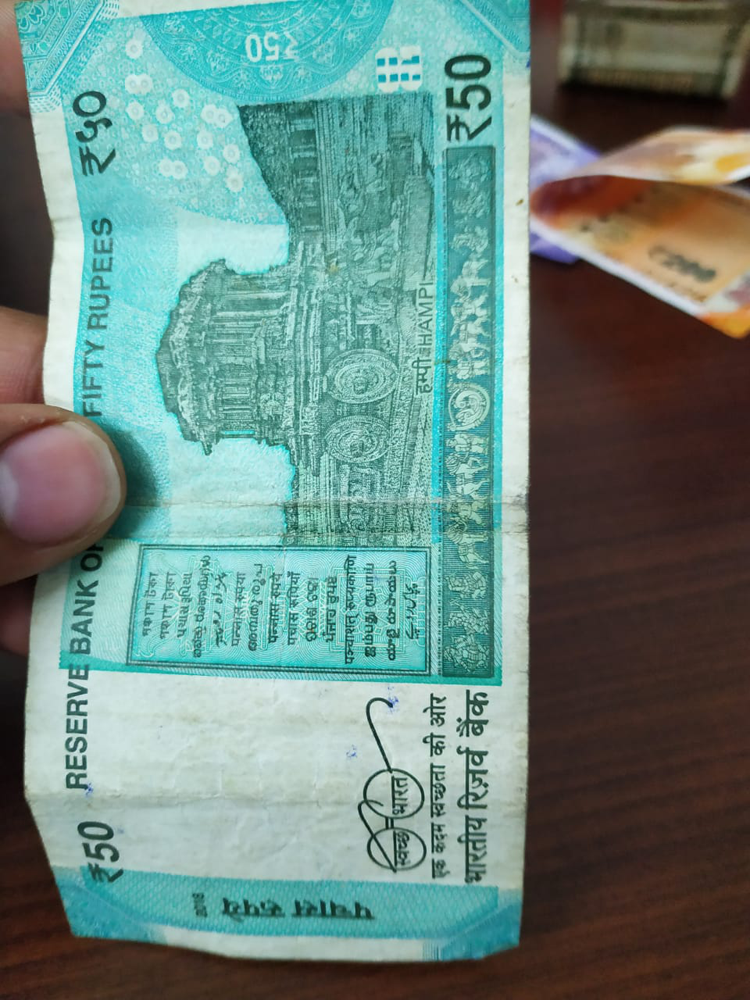

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'inr\\100': '0.05',
 'inr\\200': '0.58',
 'inr\\50': '99.33',
 'inr\\500': '0.05'}

In [0]:
img = open_image(path/'trial'/'14.jpeg')

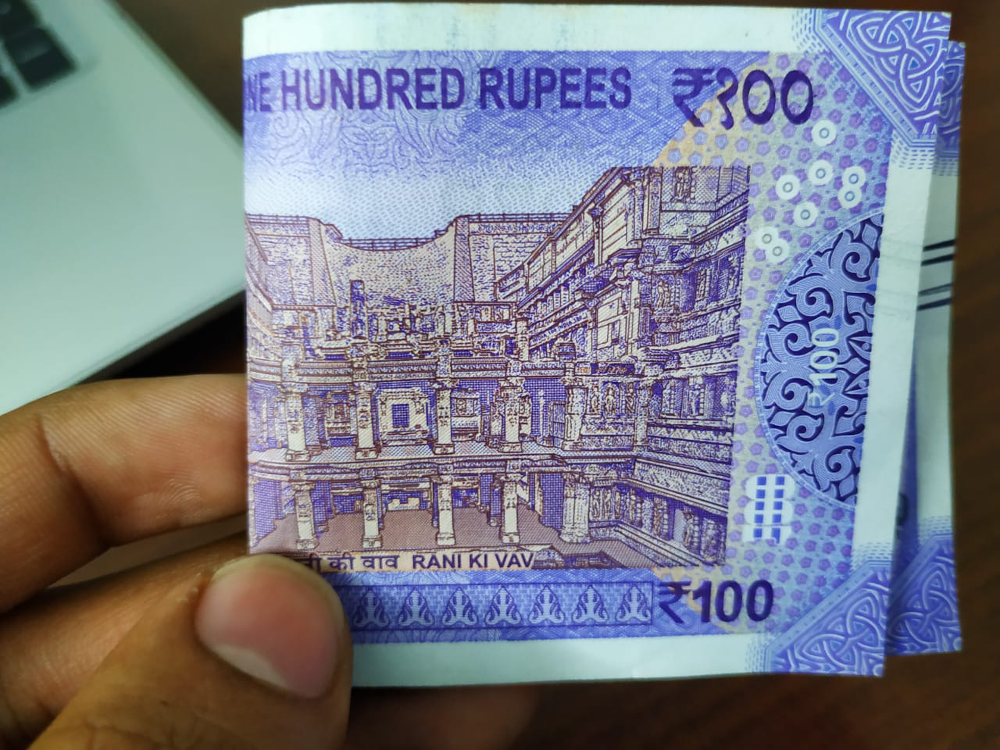

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'inr\\100': '99.78',
 'inr\\200': '0.13',
 'inr\\50': '0.01',
 'inr\\500': '0.08'}

In [0]:
img = open_image(path/'trial'/'93.jpeg')

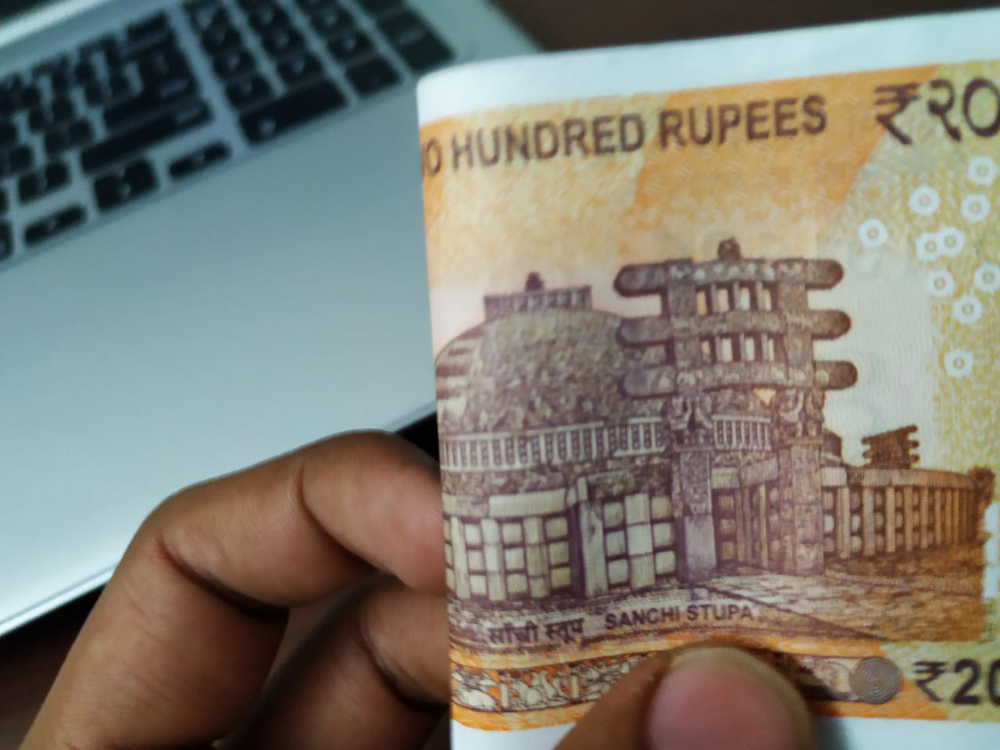

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'inr\\100': '0.00',
 'inr\\200': '100.00',
 'inr\\50': '0.00',
 'inr\\500': '0.00'}

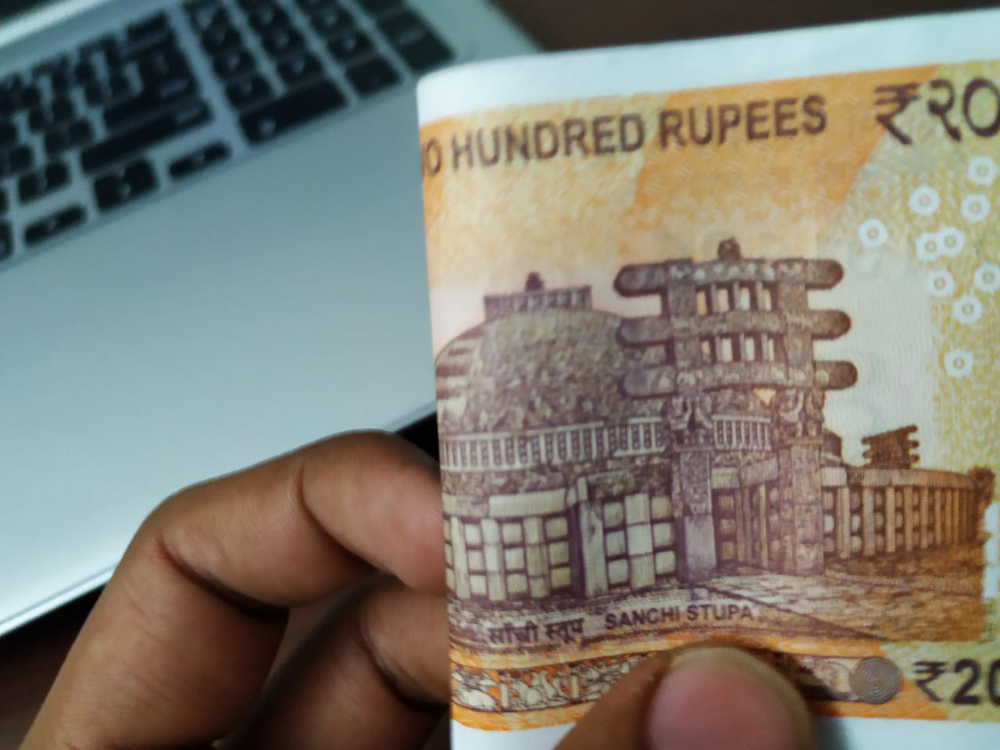

In [0]:
img

In [0]:
#img = open_image(path/'trial'/'3.jpeg')

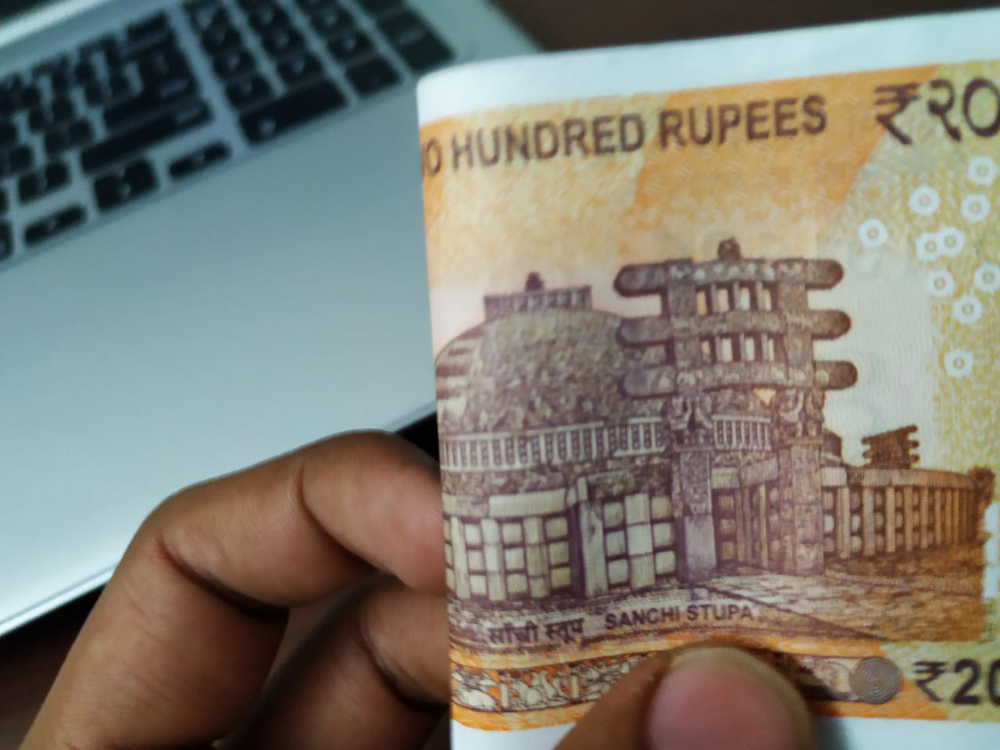

In [0]:
img

{'inr\\100': '0.17',
 'inr\\200': '99.83',
 'inr\\50': '0.00',
 'inr\\500': '0.00'}

In [0]:
img = open_image(path/'trial'/'97.jpeg')

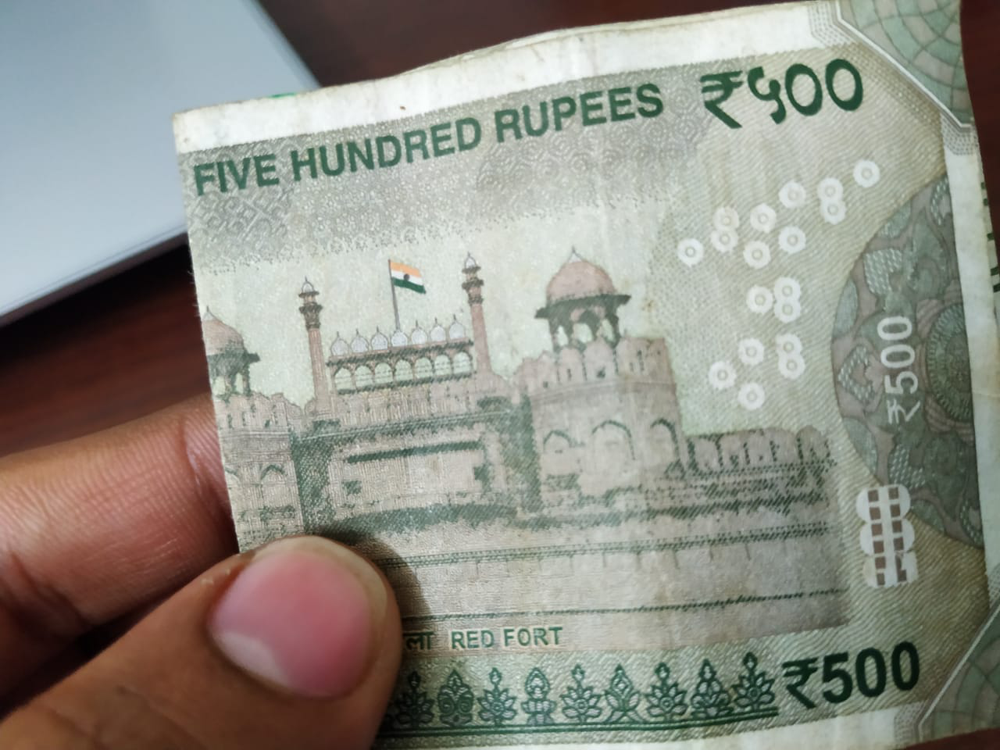

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'inr\\100': '0.01',
 'inr\\200': '0.02',
 'inr\\50': '0.22',
 'inr\\500': '99.75'}

In [0]:
img = open_image(path/'trial'/'80.jpg')

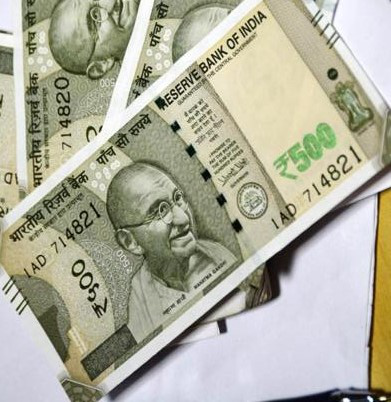

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'inr\\100': '1.71',
 'inr\\200': '8.94',
 'inr\\50': '30.96',
 'inr\\500': '58.39'}

In [0]:
img = open_image(path/'trial'/'61.jpg')

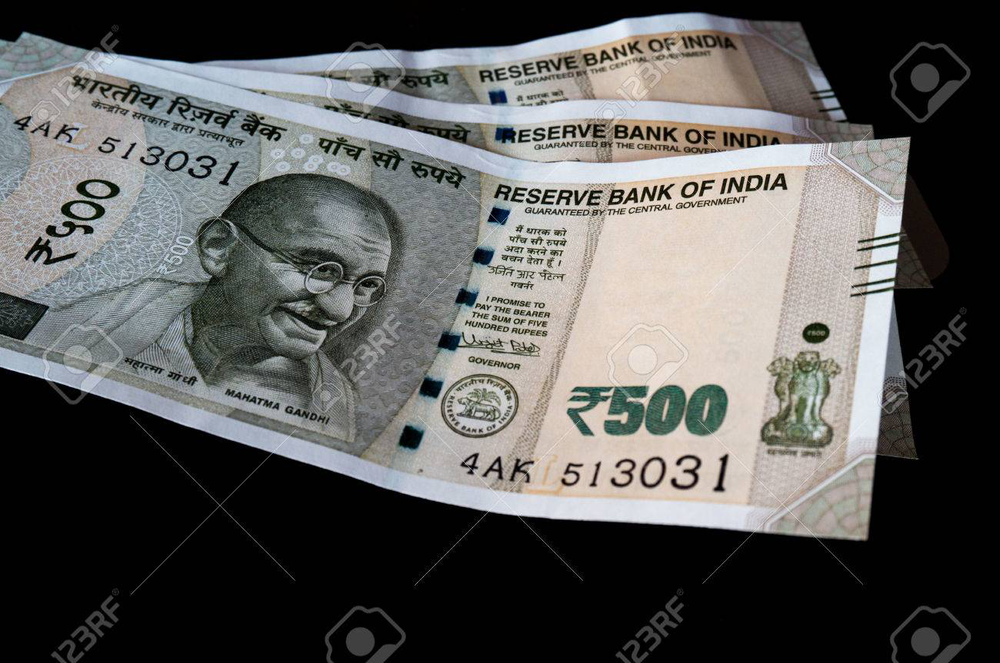

In [0]:
img

In [0]:
#

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'inr\\100': '0.00',
 'inr\\200': '0.03',
 'inr\\50': '0.01',
 'inr\\500': '99.96'}

In [0]:
learn.save('stage-2-resnet18')

In [0]:
img = open_image(path/'trial'/'3.jpeg')

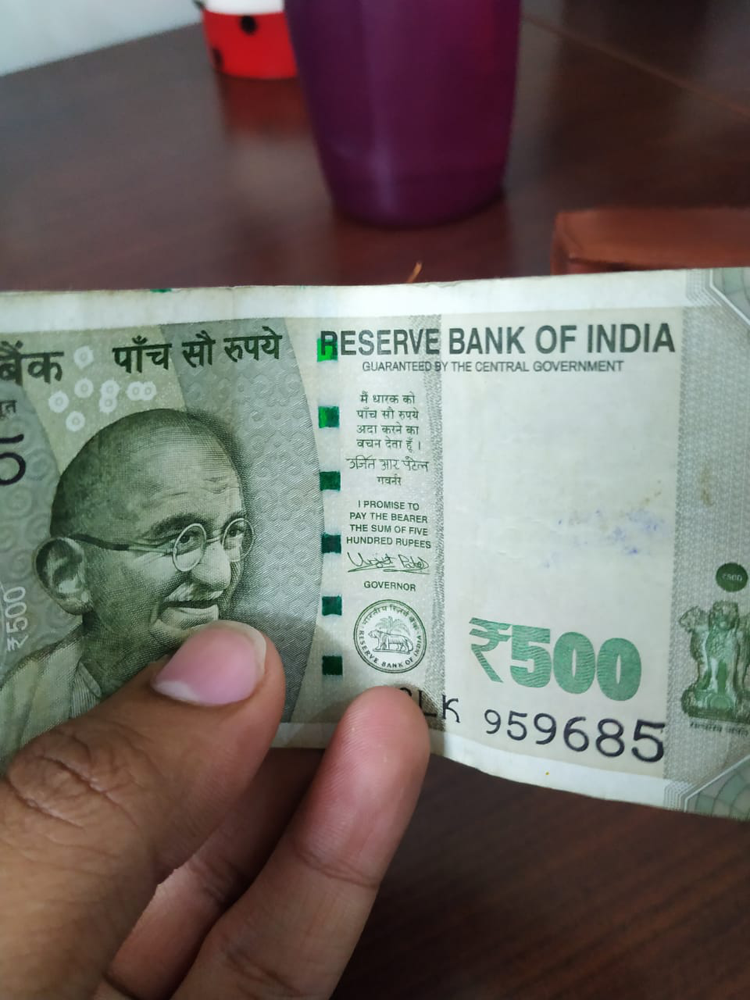

In [0]:
img

In [0]:
pred=learn.predict(img)
probabilities=[ '%.2f' % float(100*elem) for elem in pred[2] ]
dict(zip(data.classes,probabilities))

{'inr\\100': '0.95',
 'inr\\200': '0.00',
 'inr\\50': '0.05',
 'inr\\500': '99.00'}

In [0]:
learn.load('stage-2-resnet18')

Learner(data=ImageDataBunch;

Train: LabelList (102 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
inr\100,inr\100,inr\100,inr\100,inr\100
Path: C:\Users\Admin\Desktop\single_class_imgs;

Valid: LabelList (34 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
inr\200,inr\500,inr\100,inr\500,inr\50
Path: C:\Users\Admin\Desktop\single_class_imgs;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   

In [0]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


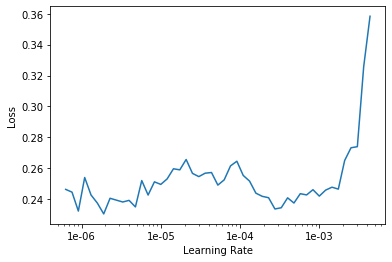

In [0]:
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,accuracy,time
0,0.166867,0.269615,0.911765,00:43
1,0.232987,0.227148,0.911765,00:43
2,0.228323,0.328217,0.911765,00:48
3,0.190362,0.370414,0.911765,00:39
4,0.185073,0.366227,0.911765,00:44
5,0.156721,0.349921,0.911765,00:47
6,0.131262,0.267328,0.911765,00:42
7,0.121298,0.206918,0.911765,00:45
8,0.112594,0.178738,0.911765,00:44
9,0.101152,0.202560,0.911765,00:45


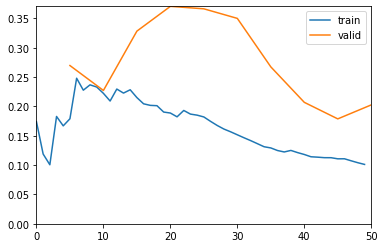

In [0]:
lr=1e-3
learn.fit_one_cycle(10, max_lr=slice(1e-4, 1e-3),callbacks=ShowGraph(learn))

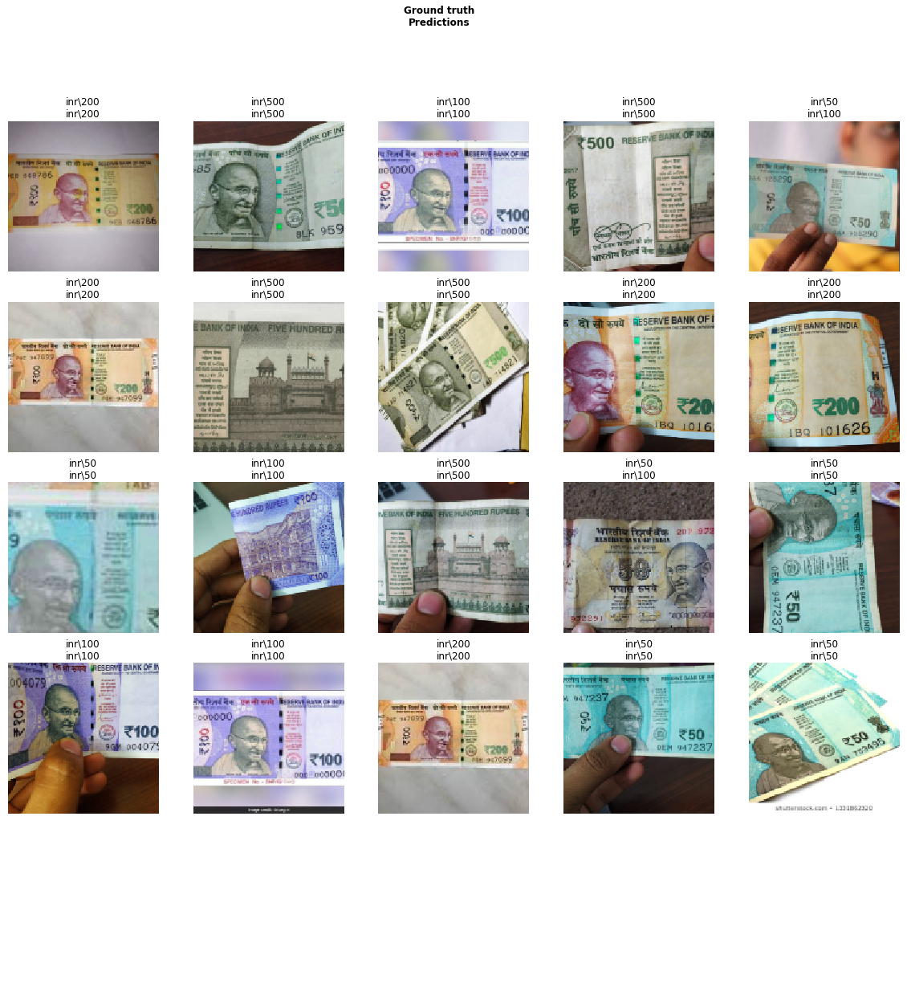

In [0]:
learn.show_results()